In [29]:
jsonl_path_diff = "gpt2_defects4j/layer0/feature_importance_diff.jsonl"
jsonl_path_safe = "gpt2_defects4j/layer0/feature_importance_safe.jsonl"
jsonl_path_vuln = "gpt2_defects4j/layer0/feature_importance_vuln.jsonl"


In [30]:
import json
import pandas as pd
import numpy as np


In [31]:

def read_jsonl_file(jsonl_path):
    with open(jsonl_path, "r") as f:
        for line in f:
            yield json.loads(line)


def get_training_indexes(diff_df):
    return np.random.choice(diff_df.index, int(len(diff_df) * 0.8), replace=False)

diff_data = list(read_jsonl_file(jsonl_path_diff))
diff_df = pd.DataFrame(diff_data)

safe_data = list(read_jsonl_file(jsonl_path_safe))
safe_df = pd.DataFrame(safe_data)

vuln_data = list(read_jsonl_file(jsonl_path_vuln))
vuln_df = pd.DataFrame(vuln_data)

vuln_df.drop(columns=["labels", "model", "plot_type"], inplace=True)
vuln_df["vuln"] = 1

safe_df.drop(columns=["labels", "model", "plot_type"], inplace=True)
safe_df["vuln"] = 0

train_indexes = get_training_indexes(diff_df)



safe_df_train = safe_df.loc[train_indexes]
safe_df_test = safe_df.drop(train_indexes)

vuln_df_train = vuln_df.loc[train_indexes]
vuln_df_test = vuln_df.drop(train_indexes)


df_train = pd.concat([safe_df_train, vuln_df_train])
df_test = pd.concat([safe_df_test, vuln_df_test])

df_train = df_train.sample(frac=1).reset_index(drop=True)
df_test = df_test.sample(frac=1).reset_index(drop=True)

# Dont know if we will use this here
diff_df_train = diff_df.loc[train_indexes]
diff_df_test = diff_df.drop(train_indexes)

# Train based on PCA

In [32]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)

pca_result = pca.fit_transform(df_train["values"].values.tolist())
df_train_pca = pd.DataFrame(pca_result, columns=[f"pca_{i}" for i in range(10)])
df_train_pca["vuln"] = df_train["vuln"]

pca_result = pca.transform(df_test["values"].values.tolist())
df_test_pca = pd.DataFrame(pca_result, columns=[f"pca_{i}" for i in range(10)])
df_test_pca["vuln"] = df_test["vuln"]

In [33]:
# logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

X_train = df_train_pca.drop(columns=["vuln"])
y_train = df_train_pca["vuln"]

X_test = df_test_pca.drop(columns=["vuln"])
y_test = df_test_pca["vuln"]

clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.73      0.72      0.73        94
           1       0.73      0.73      0.73        94

    accuracy                           0.73       188
   macro avg       0.73      0.73      0.73       188
weighted avg       0.73      0.73      0.73       188



### PCA on diff

In [34]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)

pca_result = pca.fit_transform(diff_df["values"].values.tolist())
diff_df_pca = pd.DataFrame(pca_result, columns=[f"pca_{i}" for i in range(10)])

In [35]:
pca_result = pca.transform(df_train["values"].values.tolist())
df_train_pca = pd.DataFrame(pca_result, columns=[f"pca_{i}" for i in range(10)])
df_train_pca["vuln"] = df_train["vuln"]

pca_result = pca.transform(df_test["values"].values.tolist())
df_test_pca = pd.DataFrame(pca_result, columns=[f"pca_{i}" for i in range(10)])
df_test_pca["vuln"] = df_test["vuln"]

In [36]:
# logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

X_train = df_train_pca.drop(columns=["vuln"])
y_train = df_train_pca["vuln"]

X_test = df_test_pca.drop(columns=["vuln"])
y_test = df_test_pca["vuln"]

clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.73      0.67      0.70        94
           1       0.70      0.76      0.72        94

    accuracy                           0.71       188
   macro avg       0.71      0.71      0.71       188
weighted avg       0.71      0.71      0.71       188



# Train based on Diff


In [37]:
train_df_diff = diff_df.loc[train_indexes]
def get_most_important_features(train_df_diff, n=100):
    return train_df_diff.sum(axis=0).sort_values(ascending=False).index[1 : n + 1]
train_df_diff

,index,model,plot_type,sae_id,cache_component,values,labels
202,202,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.007693976163864136, 0.0, 0.0, 0.0, 0.0...","[feature_0, feature_1, feature_2, feature_3, f..."
311,311,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0175403337925...","[feature_0, feature_1, feature_2, feature_3, f..."
151,151,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0175050403922...","[feature_0, feature_1, feature_2, feature_3, f..."
171,171,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[feature_0, feature_1, feature_2, feature_3, f..."
250,250,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0171079840511...","[feature_0, feature_1, feature_2, feature_3, f..."
...,...,...,...,...,...,...,...
70,70,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0156843606382...","[feature_0, feature_1, feature_2, feature_3, f..."
231,231,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.005505615845322609, 0.0, 0.0, 0.0, 0.0...","[feature_0, feature_1, feature_2, feature_3, f..."
405,405,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0118592362850...","[feature_0, feature_1, feature_2, feature_3, f..."
256,256,gpt2-small,sae-feature-importance,blocks.0.hook_resid_pre,hook_sae_acts_post,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[feature_0, feature_1, feature_2, feature_3, f..."


In [38]:
from tqdm import trange
def get_diff_data(diff_jsonl_path):
    diff_data = list(read_jsonl_file(diff_jsonl_path))
    diff_df = pd.DataFrame(diff_data)

    columns = diff_df.columns.to_list()
    columns.remove("values")

    diff_df.drop(columns=columns, inplace=True)

    for i in trange(len(diff_df["values"][0])):
        diff_df[f"feature_{i}"] = diff_df["values"].apply(lambda x: x[i])

    diff_df.drop(columns=["values"], inplace=True)

    return diff_df


train_df_diff = get_diff_data(jsonl_path_diff)
most_important_features = get_most_important_features(train_df_diff, n=10)
# Convert most_important_features to idxs
most_important_features_idxs = [int(feature.split("_")[1]) for feature in most_important_features]
most_important_features_idxs

  0%|          | 0/24576 [00:00<?, ?it/s]/var/folders/b4/lwfgccm95kqd2skcwvrt2fr00000gn/T/ipykernel_47953/1655927949.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  diff_df[f"feature_{i}"] = diff_df["values"].apply(lambda x: x[i])
/var/folders/b4/lwfgccm95kqd2skcwvrt2fr00000gn/T/ipykernel_47953/1655927949.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  diff_df[f"feature_{i}"] = diff_df["values"].apply(lambda x: x[i])
/var/folders/b4/lwfgccm95kqd2skcwvrt2fr00000gn/T/ipykernel_47953/1655927949.py:12: PerformanceWarning: 

[1352, 6111, 21821, 18861, 24401, 22351, 22338, 7101, 9237, 6002]

In [39]:
# logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

X_train = df_train["values"].values.tolist()
X_train = [[x[i] for i in most_important_features_idxs] for x in X_train]
y_train = df_train["vuln"]

X_test = df_test["values"].values.tolist()
X_test = [[x[i] for i in most_important_features_idxs] for x in X_test]
y_test = df_test["vuln"]


clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.75      0.64      0.69        94
           1       0.69      0.79      0.73        94

    accuracy                           0.71       188
   macro avg       0.72      0.71      0.71       188
weighted avg       0.72      0.71      0.71       188



## Clustering

In [56]:
X_train = df_train["values"].values.tolist()
X_test = df_test["values"].values.tolist()

158


 89%|████████▉ | 141/158 [07:27<02:04,  7.32s/it]/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (521) found smaller than n_clusters (530). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
 90%|████████▉ | 142/158 [07:33<01:53,  7.09s/it]/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (521) found smaller than n_clusters (540). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
 91%|█████████ | 143/158 [07:40<01:43,  6.90s/it]/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (521) found smaller than n_clusters (550). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
 91%|█████████ | 144/158 [07:52<01:58,  8.44s/it]/Users/ruimelo/

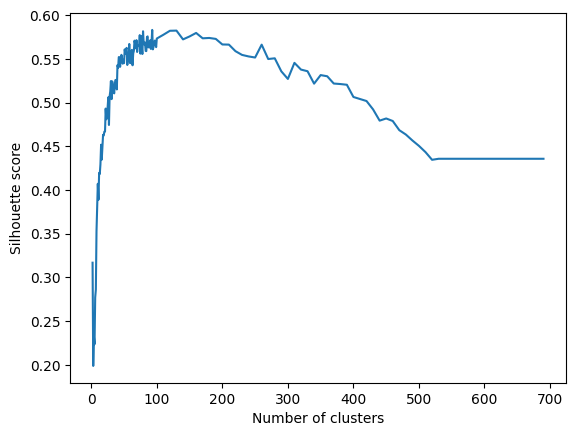

In [61]:
# Unsuperwised clustering
from sklearn.cluster import KMeans

# find the ideal number of clusters
from sklearn.metrics import silhouette_score
sil = []

k_values = []
k_values.extend(np.arange(2, 100, 1).tolist())
k_values.extend(np.arange(100, 700, 10).tolist())
# k_values.extend(np.arange(1000, 10000, 100).tolist())
# k_values.extend(np.arange(10000, 16000, 1000).tolist())
print(len(k_values))
from tqdm import trange, tqdm
for k in tqdm(k_values):
    kmeans = KMeans(n_clusters=k).fit(X_train)
    labels = kmeans.labels_
    sil.append(silhouette_score(X_train, labels, metric = 'euclidean'))

import matplotlib.pyplot as plt
plt.plot(k_values, sil)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()



## CLassical ML

In [16]:
OUR_STANDARD_TOKENIZER = "meta-llama/Llama-3.1-8B"
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained(OUR_STANDARD_TOKENIZER)

In [18]:
defects4j_path = "artifacts/defects4j.csv"
defects4j_df = pd.read_csv(defects4j_path)
gbug_path = "artifacts/gbug-java.csv"
gbug_df = pd.read_csv(gbug_path)
human_eval_path = "artifacts/humaneval.csv"
human_eval_df = pd.read_csv(human_eval_path)

In [19]:
tokenizer.pad_token = tokenizer.eos_token
tokenizer.pad_token_id = tokenizer.eos_token_id
from tqdm import tqdm
tqdm.pandas()
gbug_df["tokenized_before"] = gbug_df["func_before"].progress_apply(lambda x: tokenizer(x, return_tensors="pt", padding="max_length", truncation=True, max_length=5000
                                                                      )["input_ids"])
gbug_df["tokenized_after"] = gbug_df["func_after"].progress_apply(lambda x: tokenizer(x, return_tensors="pt",padding="max_length",truncation=True, max_length=5000
                                                                      )["input_ids"])
defects4j_df["tokenized_before"] = defects4j_df["func_before"].progress_apply(lambda x: tokenizer(x, return_tensors="pt", padding="max_length",truncation=True, max_length=5000
                                                                        )["input_ids"])
defects4j_df["tokenized_after"] = defects4j_df["func_after"].progress_apply(lambda x: tokenizer(x, return_tensors="pt", padding="max_length",truncation=True, max_length=5000
                                                                        )["input_ids"])
human_eval_df["tokenized_before"] = human_eval_df["func_before"].progress_apply(lambda x: tokenizer(x, return_tensors="pt", padding="max_length",truncation=True, max_length=5000
                                                                        )["input_ids"])
human_eval_df["tokenized_after"] = human_eval_df["func_after"].progress_apply(lambda x: tokenizer(x, return_tensors="pt", padding="max_length", truncation=True, max_length=5000
                                                                        )["input_ids"])



100%|██████████| 162/162 [00:00<00:00, 669.75it/s]


In [20]:
gbug_df["tokenized_before"].iloc[0].shape

torch.Size([1, 5000])

In [21]:
gbug_df_classical = pd.DataFrame()

for row in gbug_df.iterrows():
    row = row[1]
    gbug_df_classical = pd.concat([gbug_df_classical, pd.DataFrame({"tokens": row["tokenized_before"].tolist(), "vuln": 1}, index=[0])])
    gbug_df_classical = pd.concat([gbug_df_classical, pd.DataFrame({"tokens": row["tokenized_after"].tolist(), "vuln": 0}, index=[0])])

defects4j_df_classical = pd.DataFrame()

for row in defects4j_df.iterrows():
    row = row[1]
    defects4j_df_classical = pd.concat([defects4j_df_classical, pd.DataFrame({"tokens": row["tokenized_before"].tolist(), "vuln": 1}, index=[0])])
    defects4j_df_classical = pd.concat([defects4j_df_classical, pd.DataFrame({"tokens": row["tokenized_after"].tolist(), "vuln": 0}, index=[0])])

human_eval_df_classical = pd.DataFrame()

for row in human_eval_df.iterrows():
    row = row[1]
    human_eval_df_classical = pd.concat([human_eval_df_classical, pd.DataFrame({"tokens": row["tokenized_before"].tolist(), "vuln": 1}, index=[0])])
    human_eval_df_classical = pd.concat([human_eval_df_classical, pd.DataFrame({"tokens": row["tokenized_after"].tolist(), "vuln": 0}, index=[0])])

In [22]:
# shuffle
gbug_df_classical = gbug_df_classical.sample(frac=1).reset_index(drop=True)
defects4j_df_classical = defects4j_df_classical.sample(frac=1).reset_index(drop=True)
human_eval_df_classical = human_eval_df_classical.sample(frac=1).reset_index(drop=True)

# split
# gbug_df_train = gbug_df_classical.loc[train_indexes]
# gbug_df_test = gbug_df_classical.drop(train_indexes)

defects4j_df_train = defects4j_df_classical.loc[train_indexes]
defects4j_df_test = defects4j_df_classical.drop(train_indexes)

# human_eval_df_train = human_eval_df_classical.loc[train_indexes]
# human_eval_df_test = human_eval_df_classical.drop(train_indexes)

In [25]:
# Classical logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
import torch

X_train = defects4j_df_train["tokens"].values.tolist()
X_train = [torch.tensor(x) for x in X_train]
y_train = defects4j_df_train["vuln"]

X_test = defects4j_df_test["tokens"].values.tolist()
X_test = [torch.tensor(x) for x in X_test]
y_test = defects4j_df_test["vuln"]


# Do grid search
from sklearn.model_selection import GridSearchCV

param_grid = {
    "C": [ 0.001],
    "max_iter": [100],
    "solver": ["newton-cg"]
}

clf = GridSearchCV(LogisticRegression(random_state=0), param_grid, cv=5, verbose=3)  # Verbose level 3 for detailed output

# Do verbose to see progress
clf.fit(X_train, y_train)

print(clf.best_params_)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 1 candidates, totalling 5 fits


/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/utils/optimize.py:318: ConvergenceWarning: newton-cg failed to converge at loss = 0.022207957696146818. Increase the number of iterations.
  warnings.warn(


[CV 1/5] END C=0.001, max_iter=100, solver=newton-cg;, score=0.600 total time=   2.1s


/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/utils/optimize.py:318: ConvergenceWarning: newton-cg failed to converge at loss = 0.017663107085874215. Increase the number of iterations.
  warnings.warn(


[CV 2/5] END C=0.001, max_iter=100, solver=newton-cg;, score=0.573 total time=   3.0s


/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/utils/optimize.py:318: ConvergenceWarning: newton-cg failed to converge at loss = 0.017014127379626962. Increase the number of iterations.
  warnings.warn(


[CV 3/5] END C=0.001, max_iter=100, solver=newton-cg;, score=0.493 total time=   6.3s


/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/utils/optimize.py:318: ConvergenceWarning: newton-cg failed to converge at loss = 0.009625222551745138. Increase the number of iterations.
  warnings.warn(


[CV 4/5] END C=0.001, max_iter=100, solver=newton-cg;, score=0.486 total time=   3.0s


/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/utils/optimize.py:318: ConvergenceWarning: newton-cg failed to converge at loss = 0.018169551067094284. Increase the number of iterations.
  warnings.warn(


[CV 5/5] END C=0.001, max_iter=100, solver=newton-cg;, score=0.608 total time=   2.7s
{'C': 0.001, 'max_iter': 100, 'solver': 'newton-cg'}
              precision    recall  f1-score   support

           0       0.47      0.53      0.50       271
           1       0.49      0.44      0.46       286

    accuracy                           0.48       557
   macro avg       0.48      0.48      0.48       557
weighted avg       0.48      0.48      0.48       557



/Users/ruimelo/anaconda3/envs/phd/lib/python3.10/site-packages/sklearn/utils/optimize.py:318: ConvergenceWarning: newton-cg failed to converge at loss = 0.0221756794680267. Increase the number of iterations.
  warnings.warn(
